# Final Project Phase 3 Summary
This Jupyter Notebook (.ipynb) will serve as the skeleton file for your submission for Phase 3 of the Final Project. Complete all sections below as specified in the instructions for the project, covering all necessary details. We will use this to grade your individual code (Do this whether you are in a group or not). Good luck! <br><br>

Note: To edit a Markdown cell, double-click on its text.

## Jupyter Notebook Quick Tips
Here are some quick formatting tips to get you started with Jupyter Notebooks. This is by no means exhaustive, and there are plenty of articles to highlight other things that can be done. We recommend using HTML syntax for Markdown but there is also Markdown syntax that is more streamlined and might be preferable. 
<a href = "https://towardsdatascience.com/markdown-cells-jupyter-notebook-d3bea8416671">Here's an article</a> that goes into more detail. (Double-click on cell to see syntax)

# Heading 1
## Heading 2
### Heading 3
#### Heading 4
<br>
<b>BoldText</b> or <i>ItalicText</i>
<br> <br>
Math Formulas: $x^2 + y^2 = 1$
<br> <br>
Line Breaks are done using br enclosed in < >.
<br><br>
Hyperlinks are done with: <a> https://www.google.com </a> or 
<a href="http://www.google.com">Google</a><br>

# Video Presentation

If you uploaded your Video Presentation to Bluejeans, YouTube, or any other streaming services, please provide the link here:


*   https://www.youtube.com/watch?v=gGSoLf_uNYY


Make sure the video sharing permissions are accessible for anyone with the provided link.

# Data Collection and Cleaning


Transfer/update the data collection and cleaning you created for Phase II below. You may include additional cleaning functions if you have extra datasets. If no changes are necessary, simply copy and paste your phase II parsing/cleaning functions.


## Downloaded Dataset Requirement



In [81]:
import csv
import pandas as pd

def csv_data_parser():
    with open('2009_2020CrimeData.csv', 'r') as file:
        f = csv.reader(file)
        readerList = [line for line in f]

    readerList[0][0] = 'IDCol' #The IDCol Column heading has some invisible strings, making it hard to reference

    df = pd.DataFrame( readerList[1:], columns=readerList[0] )

    df = df.sort_values(by=['Report Number'])
    df = df.reset_index()


    dropIndexes = []
    for i in df.index[1:]:
        if df.loc[i, 'Report Number'] == df.loc[i - 1, 'Report Number']:
            dropIndexes.append(i)

    df = df.drop(dropIndexes, axis = 0)
    df = df.drop(['index'], axis=1)


    for i in df.index:
        if df.loc[i, 'Occur Date'] == 'NULL':
            df.loc[i, 'Occur Date'] = df.loc[i, 'Report Date'].split()[0]

        if df.loc[i, 'Occur Time'] == 'NULL':
            df.loc[i, 'Occur Time'] = '12:00:00 AM'


        if df.loc[i, 'Possible Date'] == 'NULL':
            df.loc[i, 'Possible Date'] = df.loc[i, 'Report Date'].split()[0]

        if df.loc[i, 'Possible Time'] == 'NULL':
            df.loc[i, 'Possible Time'] = '12:00:00 AM'	

    df.to_csv('cleaned_atlantaCrime_csv_data')
    return df

############ Function Call ############
csv_data_parser()

,IDCol,Report Number,Report Date,Day Occurred,Day Number,Occur Date,Occur Time,Possible Date,Possible Time,Beat,...,Apartment Number,Crime Type,NIBRS Code,Neighborhood,NPU,Longitude,Latitude,ObjectId,x,y
0,285938,100010117,1/1/2010 12:00:00 AM,Thursday,5,12/31/2009,15:00,1/1/2010,0:30,611,...,8201,AUTO THEFT,2424,Norwood Manor,Z,-84.35805,33.69307,327124,-9390695.17031351,3987662.90885096
1,236487,100010121,1/1/2010 12:00:00 AM,Friday,6,1/1/2010,0:15,1/1/2010,0:19,308,...,NULL,LARCENY-FROM VEHICLE,2305,Perkerson,X,-84.40902,33.68274,327411,-9396369.12475924,3986280.89935285
2,236485,100010127,1/1/2010 12:00:00 AM,Thursday,5,12/31/2009,17:00,12/31/2009,19:00,205,...,NULL,LARCENY-FROM VEHICLE,2305,Buckhead Forest,B,-84.38044,33.85211,327413,-9393187.61371237,4008961.25696364
3,88666,100010147,1/1/2010 12:00:00 AM,Friday,6,1/1/2010,0:30,1/1/2010,0:40,508,...,NULL,ROBBERY,1204,Downtown,M,-84.39479,33.75104,327250,-9394785.04840526,3995421.56859436
4,22330,100010149,1/1/2010 12:00:00 AM,Friday,6,1/1/2010,0:45,1/1/2010,0:50,308,...,O-9,BURGLARY,2202,Hammond Park,X,-84.41557,33.67399,327391,-9397098.26742394,3985110.40165548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
366819,175229,93652065,12/31/2009 12:00:00 AM,Thursday,5,12/31/2009,22:45,12/31/2009,23:00,304,...,NULL,AGG ASSAULT,1314,Grant Park,W,-84.37578,33.73009,327537,-9392668.86488528,3992617.0321737
366820,252134,93652076,12/31/2009 12:00:00 AM,Thursday,5,12/31/2009,22:30,12/31/2009,23:05,408,...,NULL,AUTO THEFT,2404,Greenbriar,R,-84.48805,33.68947,327535,-9405166.70411664,3987181.26035334
366821,240438,93652121,12/31/2009 12:00:00 AM,Thursday,5,12/31/2009,23:23,12/31/2009,23:23,510,...,201,AGG ASSAULT,1399,Old Fourth Ward,M,-84.372,33.76777,327434,-9392248.07721008,3997661.67380008
366822,236500,93652147,12/31/2009 12:00:00 AM,Thursday,5,12/31/2009,15:00,12/31/2009,23:00,507,...,NULL,LARCENY-FROM VEHICLE,2305,Downtown,M,-84.389,33.76332,327457,-9394140.50855356,3997065.78723408


## Web Collection Requirement \#1


In [50]:
import requests
import pandas as pd

def api_web_parser1():

	URL = 'https://sharefulton.fultoncountyga.gov/resource/5rm7-xueu.json?area_code='
	AREA_CODE = 'CT1304000000000'
	OFFSET = '&$offset=1099'

	response = requests.get(URL+AREA_CODE+OFFSET)

	df = pd.DataFrame(response.json() )

	df['value'] = df['value'].astype(float)
	df['year'] = df['year'].astype(int)
	df = df.sort_values(by='month2')

	droplist = []
	for i in df.index:
		if df.loc[i,'year'] < 2009:
			droplist.append(i)
		if df.loc[i,'series_id'] != 'LAUCT130400000000005':
			droplist.append(i)

	df = df.drop(droplist, axis=0)

	df.to_csv('cleaned_unemployment_api_data.csv')
	return df



############ Function Call ############
api_web_parser1()

,id,series_id,year,period,value,area_code,month,area_text,series_title,month2,footnote_codes
0,288624,LAUCT130400000000005,2009,M01,211328.0,CT1304000000000,2009-01-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2009-01-01,NaN
12,288636,LAUCT130400000000005,2009,M13,209560.0,CT1304000000000,2009-01-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2009-01-01,NaN
1,288625,LAUCT130400000000005,2009,M02,211061.0,CT1304000000000,2009-02-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2009-02-01,NaN
2,288626,LAUCT130400000000005,2009,M03,211152.0,CT1304000000000,2009-03-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2009-03-01,NaN
3,288627,LAUCT130400000000005,2009,M04,210907.0,CT1304000000000,2009-04-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2009-04-01,NaN
...,...,...,...,...,...,...,...,...,...,...,...
174,288798,LAUCT130400000000005,2022,M06,264603.0,CT1304000000000,2022-06-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2022-06-01,NaN
175,288799,LAUCT130400000000005,2022,M07,264532.0,CT1304000000000,2022-07-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2022-07-01,NaN
176,288800,LAUCT130400000000005,2022,M08,262825.0,CT1304000000000,2022-08-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2022-08-01,NaN
177,288801,LAUCT130400000000005,2022,M09,265099.0,CT1304000000000,2022-09-01T00:00:00.000,"Atlanta city, GA","Employment: Atlanta city, GA (U)",2022-09-01,NaN


## Web Collection Requirement #2

In [52]:
def web_parser2():
  from selenium import webdriver
  from selenium.webdriver.chrome.service import Service
  from selenium.webdriver.common.by import By
  from webdriver_manager.chrome import ChromeDriverManager
  from selenium.webdriver.support.ui import Select

  import time

  from bs4 import BeautifulSoup
  import pandas as pd

  driver = webdriver.Chrome(service=Service(ChromeDriverManager().install()))

  # Open Scrapingbee's website
  driver.get('https://data.bls.gov/dataViewer/view/timeseries/LNS11300000')
  start_year_dropdown = driver.find_element(By.TAG_NAME, 'select')
  select = Select( start_year_dropdown )
  select.select_by_visible_text('2008')

  update_button = driver.find_element(By.XPATH, '//*[@id="dv-submit"]')
  update_button.click()

  time.sleep(2)


  html = driver.page_source


  soup = BeautifulSoup(html , 'html.parser')
  data_value = soup.find('div', {'id' : 'bodytext'} ).find('div', {'id' : 'tablediv1'} ).find('tbody').find_all('td', {'class' : ""})
  data_time = soup.find('div', {'id' : 'bodytext'} ).find('div', {'id' : 'tablediv1'} ).find('tbody').find_all('td', {'class' : "abbrlabel"})
  data_period = soup.find('div', {'id' : 'bodytext'} ).find('div', {'id' : 'tablediv1'} ).find('tbody').find_all('td', {'class' : "period"})


  data_dictionary={}

  value_list = []
  time_list = []
  period_list = []

  for i in data_value:
      value_list.append(i.text.strip() )

  for j in data_time:
      time_list.append(j.text.strip() )

  for k in data_period:
      period_list.append(k.text.strip() )

  for item in range( len(value_list) ):
      data_dictionary[item] = [value_list[item], time_list[item], period_list[item]]
      
  for key in data_dictionary:
      data_dictionary[key][1] = f'{data_dictionary[key][1].split()[0]}-{data_dictionary[key][2][1:]}-01' 

  df = pd.DataFrame(data_dictionary, index=['values', 'date', 'period']).T 

  df.to_csv('cleaned_webscrapped_data.csv')

  return df





############ Function Call ############
web_parser2()

,values,date,period
0,66.2,2008-01-01,M01
1,66.0,2008-02-01,M02
2,66.1,2008-03-01,M03
3,65.9,2008-04-01,M04
4,66.1,2008-05-01,M05
...,...,...,...
198,62.7,2024-07-01,M07
199,62.7,2024-08-01,M08
200,62.7,2024-09-01,M09
201,62.6,2024-10-01,M10


#Inconsistency Revisions
 **If you were requested to revise your inconsistency section from Phase II, enter your responses here. Otherwise, ignore this section.**

For each inconsistency (NaN, null, duplicate values, empty strings, etc.) you discover in your datasets, write at least 2 sentences stating the significance, how you identified it, and how you handled it.

1. 

2. 

3. 

4. (if applicable)

5. (if applicable)


## Data Sources

Include sources (as links) to your datasets. If any of these are different from your sources used in Phase II, please <b>clearly</b> specify.

*   Downloaded Dataset Source: https://experience.arcgis.com/experience/76b68b923a094fb5a2d193ace5ccb975/
*   Web Collection #1 Source: https://sharefulton.fultoncountyga.gov/dataset/Monthly-Unemployment-Rates-for-Georgia-Places/5rm7-xueu/data_preview
*   Web Collection #2 Source: https://data.bls.gov/dataViewer/view/timeseries/LNS11300000



# Data Analysis
For the Data Analysis section, you are required to utilize your data to complete the following:

*   Create at least 5 insights
*   Generate at least 3 data visualizations

Create a function for each of the following sections mentioned above. Do not forget to fill out the explanation section for each function. 

Make sure your data analysis is not too simple. Performing complex aggregation and using modules not taught in class shows effort, which will increase the chance of receiving full credit. 

# Topic Summary

As current students in Atlanta, we are interested in the well-being in our city and how much of an impact the economy has on our general safety. We aimed to create a project that looks deep into the relationship or trends between Atlanta’s crime rate, and the unemployment/labor force participation in Atlanta. Utilizing comprehensive datasets that encompass Labor Force Participation Statistics, Atlanta Crime Statistics, and Atlanta Unemployment rates, we plan to conduct an in-depth analysis of these factors in order to identify applicable insights. By bringing attention to these correlations, we wish to help Atlanta become a safer city.

## Insights

In [58]:
def insight1():

  import pandas as pd
 
  from phase2_data_cleaning.api_data_collect import api_web_parser

  dfApi = api_web_parser() 
  dfApi = dfApi.reset_index()
  dfApi = dfApi.drop(['index', 'footnote_codes', 'id', 'year', 'period', 'area_code', 'area_text', 'series_id', 'month'], axis=1)
  dfApi.columns = ['values', 'series_title', 'dates']



  dfWeb = pd.read_csv('phase2_data_cleaning/cleaned_webscrapped_data.csv')
  dfWeb['series_title'] = pd.Series(index=dfWeb.index).fillna('(Seas) Labor Force Participation Rate')
  dfWeb['dates'] = dfWeb['date']
  dfWeb = dfWeb.drop(['Unnamed: 0', 'period', 'date'], axis=1)
  
  dfApi.index = dfApi['dates']

  dfWeb.index = dfWeb['dates']
  return (dfApi['values'].corr(dfWeb['values'], method='spearman'))





############ Function Call ############
insight1()

-0.7233615194836591

### Insight 1 Explanation

Based on this insight, the correlation cofficient is -0.7. This indicates an unexpected strong negative correlation between the US Labor Force Participation rate and Atlanta's employment rate. This disparity implies that as more people around the country enter the job market, Atlanta's employment condition declines. This data supports the opposite to our initial expectation which was that an increase in the US labor force participation would lead to a similar increase in Atlanta's employment rate. 

In [60]:
def insight2():
  import pandas as pd

  def year_format(x):
      try:
          l = x.split('/')
          if len(l[1]) == 1:
              l[1] = '0' + l[1]
          if len(l[0]) == 1:
              l[0] = '0' + l[0]

          o = [l[2], l[0], l[1]]
          return ('-'.join(o) )
      except:
          a = x
  def crime_type(x):
          if x in ['HOMICIDE', 'ROBBERY', 'AGG ASSAULT']:
              return 'VIOLENT'
          else:
              return 'NON-VIOLENT'

  dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
  dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)

  dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )
  dfCrime['Crime Type'] = pd.Series(dfCrime['Crime Type']).apply( lambda x : crime_type(x) )

  dfCrime['Latitude'] = dfCrime['Latitude'].round(3)
  dfCrime['Longitude'] = dfCrime['Longitude'].round(3)

  droplist = []
  for i in dfCrime.index:
      if dfCrime.loc[i,'Occur Date'] is None:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
          droplist.append(i)
      elif  dfCrime.loc[i,'Crime Type'] == 'NON-VIOLENT':
          droplist.append(i)

  dfCrime = dfCrime.drop(droplist, axis=0)

  crime_by_neighborhood = dfCrime.groupby("Neighborhood").size().reset_index(name="Crime Count").sort_values(by='Crime Count', ascending=False)

  return (crime_by_neighborhood)

############ Function Call ############
insight2()

,Neighborhood,Crime Count
79,Downtown,3383
147,Midtown,1564
221,West End,1530
163,Old Fourth Ward,1441
108,Grove Park,1220
...,...,...
118,Horseshoe Community,1
153,Mt. Paran Parkway,1
162,Old Fairburn Village,1
187,Regency Trace,1


### Insight 2 Explanation

This insight shows the average amount of crimes per city/region within Atlanta. It shows that neighborhoods within Atlanta, have an increased average amount of crimes. The data shows that Atlanta's crime density is concentrated in areas closer to the city center. Core locations like midtown and downtown contain higher crime rates than other cities/neighborhoods. This is consistent with our initial expectations for crime density in Atlanta.

In [62]:
def insight3():
  import pandas as pd
  import numpy as np

  def year_format(x):
      try:
          l = x.split('/')
          if len(l[1]) == 1:
              l[1] = '0' + l[1]
          if len(l[0]) == 1:
              l[0] = '0' + l[0]

          o = [l[2], l[0], l[1]]
          return ('-'.join(o) )
      except:
          a = x

  dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
  dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)

  dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )


  droplist = []
  for i in dfCrime.index:
      if dfCrime.loc[i,'Occur Date'] is None:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
          droplist.append(i)

  dfCrime = dfCrime.drop(droplist, axis=0)

  stats1 = dfCrime.groupby(["Occur Date"])["Report Number"].count().reset_index()
  stats1.columns = ["Occur Date", "Number of Crimes Committed"]
  stats1['Occur Date'] = np.array(stats1['Occur Date'], dtype='datetime64[D]')
  stats1['Year'] = pd.Series(stats1['Occur Date']).apply( lambda x : x.year )

  final = stats1.groupby(['Year'])['Number of Crimes Committed'].mean().reset_index()
  return ( final)




############ Function Call ############
insight3()

,Year,Number of Crimes Committed
0,2009,108.213699
1,2010,97.936986
2,2011,96.106849
3,2012,91.994536
4,2013,89.336986
5,2014,85.827397
6,2015,82.857534
7,2016,79.551913
8,2017,72.723288
9,2018,70.443836


### Insight 3 Explanation
We were interested to see whether the crime rate over the years has changed dramatically. As students living in Atlanta, it is important to see whether our city is a safe place to live. By grouping the crimes by their year and taking the average, we came to the conclusion that the crime rate was decreasing. While at a small rate, it was clear that the data shows the average number of crimes decreasing. Though it did seem to fluctuate, the overall trend was decreasing. 


In [95]:
def insight4():
    import pandas as pd
    import numpy as np


    def year_format(x):
        try:
            l = x.split('/')
            if len(l[1]) == 1:
                l[1] = '0' + l[1]
            if len(l[0]) == 1:
                l[0] = '0' + l[0]
    
            o = [l[2], l[0], l[1]]
            return ('-'.join(o) )
        except:
            a = x
                    
    def crime_type(x):
            if x in ['HOMICIDE', 'ROBBERY', 'AGG ASSAULT']:
                return 'VIOLENT CRIMES'
            else:
                return 'NONVIOLENT CRIMES'
    
    dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
    dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)
    
    dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )
    dfCrime['Crime Type'] = pd.Series(dfCrime['Crime Type']).apply( lambda x : crime_type(x) )
    
    droplist = []
    for i in dfCrime.index:
        if dfCrime.loc[i,'Occur Date'] is None:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
            droplist.append(i)
            
    
    dfCrime = dfCrime.drop(droplist, axis=0)
    
    
    stats = dfCrime.groupby(["Occur Date", "Crime Type"])["Report Number"].count().reset_index()
    stats.columns = ["Occur Date", "Crime Type", "Number of Crimes Committed"]
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    stats['Year'] = pd.Series(stats['Occur Date']).apply( lambda x : x.year )

    final = stats.groupby(['Crime Type', 'Year'])['Number of Crimes Committed'].mean().reset_index()
    
    return (final)


############ Function Call ############
insight4()

,Crime Type,Year,Number of Crimes Committed
0,NONVIOLENT CRIMES,2009,93.583562
1,NONVIOLENT CRIMES,2010,84.706849
2,NONVIOLENT CRIMES,2011,82.649315
3,NONVIOLENT CRIMES,2012,78.707650
4,NONVIOLENT CRIMES,2013,76.438356
5,NONVIOLENT CRIMES,2014,72.997260
6,NONVIOLENT CRIMES,2015,70.854795
7,NONVIOLENT CRIMES,2016,68.068306
8,NONVIOLENT CRIMES,2017,63.093151
9,NONVIOLENT CRIMES,2018,62.353425


### Insight 4 Explanation

When we looked at the crime by year as a whole, we noticed that it was somewhat periodic through the years. We were interested in seeing whether this effect was due to violent crimes changing rapidly through the year. We expected there to be more change in violent crime than non-violent. When we filtered the data to show the average number of non violent crimes and average number of violent crimes,  we were surprised to see that the non violent crimes stayed relatively constant. While there was a slight decline to both, the number of non violent crimes wasn’t as easily susceptible to change.

In [110]:
def insight5():
    import pandas as pd
    import numpy as np

    def year_format(x):
        try:
            l = x.split('/')
            if len(l[1]) == 1:
                l[1] = '0' + l[1]
            if len(l[0]) == 1:
                l[0] = '0' + l[0]
    
            o = [l[2], l[0], l[1]]
            return ('-'.join(o) )
        except:
            a = x
                    
    def crime_type(x):
            if x in ['HOMICIDE', 'ROBBERY', 'AGG ASSAULT']:
                return 'VIOLENT CRIMES'
            else:
                return 'NONVIOLENT CRIMES'
    
    dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
    dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)
    
    dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )
    dfCrime['Crime Type'] = pd.Series(dfCrime['Crime Type']).apply( lambda x : crime_type(x) )
    
    droplist = []
    for i in dfCrime.index:
        if dfCrime.loc[i,'Occur Date'] is None:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
            droplist.append(i)
        elif dfCrime.loc[i,'Crime Type'] == 'NONVIOLENT CRIMES':
            droplist.append(i)
    
    dfCrime = dfCrime.drop(droplist, axis=0)
    stats = dfCrime.groupby(["Occur Date", "Crime Type"])["Report Number"].count().reset_index()
    stats.columns = ["Occur Date", "Crime Type", "Number of Crimes Committed"]
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    stats['Year'] = pd.Series(stats['Occur Date']).apply( lambda x : x.year )
    
    crime_by_year = stats.groupby(['Year'])['Number of Crimes Committed'].mean().reset_index()

    dfApi = pd.read_csv('phase2_data_cleaning/cleaned_unemployment_api_data.csv')
    dfApi = dfApi.reset_index()
    dfApi = dfApi.drop(['Unnamed: 0', 'index', 'footnote_codes', 'id', 'year', 'period', 'area_code', 'area_text', 'series_id', 'month'], axis=1)
    dfApi.columns = ['values', 'series_title', 'dates']
    dfApi['dates'] = np.array(dfApi['dates'], dtype='datetime64[D]')
    dfApi['Year'] = pd.Series(dfApi['dates']).apply( lambda x : x.year )
    
    employ_by_year = dfApi.groupby(['Year'])['values'].mean().reset_index()
    crime_by_year.index = crime_by_year['Year']
    employ_by_year.index = employ_by_year['Year']
    return (crime_by_year['Number of Crimes Committed'].corr(employ_by_year['values'], method='spearman'))




############ Function Call ############
insight5()

-0.9230769230769231

### Insight 5 Explanation

Knowing that the non-violent crimes fluctuate the most, meaning they might be more susceptible to change, we wanted to see how they would compare to Atlanta’s employment rate over the years. We grouped the non-crimes by year and found the average, and did the same for the Atlanta employment rates. We then found the correlation coefficient to see if these two separate groups were related. A correlation coefficient of -0.92 proves that there is a strong negative relationship between the number of non-violent crimes in Atlanta and the Employment rate in Atlanta.

## Data Visualizations

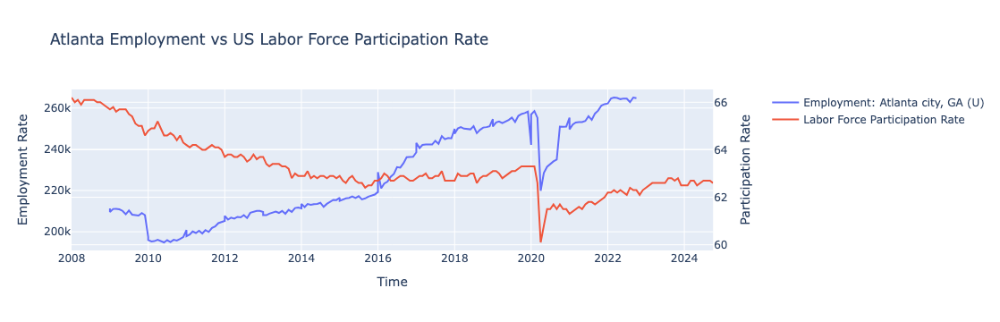

In [69]:
def visual1():

  import pandas as pd
  import plotly.graph_objects as go
  from plotly.subplots import make_subplots

  from phase2_data_cleaning.api_data_collect import api_web_parser

  dfApi = api_web_parser() 
  dfApi = dfApi.reset_index()
  dfApi = dfApi.drop(['index', 'footnote_codes', 'id', 'year', 'period', 'area_code', 'area_text', 'series_id', 'month'], axis=1)
  dfApi.columns = ['values', 'series_title', 'dates']


  dfWeb = pd.read_csv('phase2_data_cleaning/cleaned_webscrapped_data.csv')
  dfWeb['series_title'] = pd.Series(index=dfWeb.index).fillna('(Seas) Labor Force Participation Rate')
  dfWeb['dates'] = dfWeb['date']
  dfWeb = dfWeb.drop(['Unnamed: 0', 'period', 'date'], axis=1)

# # Create figure with secondary y-axis
  fig = make_subplots(specs=[[{"secondary_y": True}]])

  # Add traces
  fig.add_trace(
      go.Scatter(x=dfApi['dates'], y=dfApi['values'], name="Employment: Atlanta city, GA (U)"),
      secondary_y=False,
  )

  fig.add_trace(
      go.Scatter(x=dfWeb['dates'], y=dfWeb['values'], name="Labor Force Participation Rate"),
      secondary_y=True,
  )

  # Add figure title
  fig.update_layout(
      title_text="Atlanta Employment vs US Labor Force Participation Rate"
  )

  # Set x-axis title
  fig.update_xaxes(title_text="Time")

  # Set y-axes titles
  fig.update_yaxes(title_text="Employment Rate", secondary_y=False)
  fig.update_yaxes(title_text="Participation Rate", secondary_y=True)

  fig.show()
    
# dual_line_graph
# visualization ^

############ Function Call ############
visual1()

### Visualization 1 Explanation

This visualization demonstrates the unexpected inverse relationship between the US Labor Force Participation rate and Atlanta's employment rate. We initially expected that for increased labor force participation rates there would be an increased employment rate in Atlanta. However, the graph shows the complete opposite. This disparity implies that as more people around the country enter the job market, Atlanta's employment condition declines. Though they both showed a dip during 2020, as expected. 

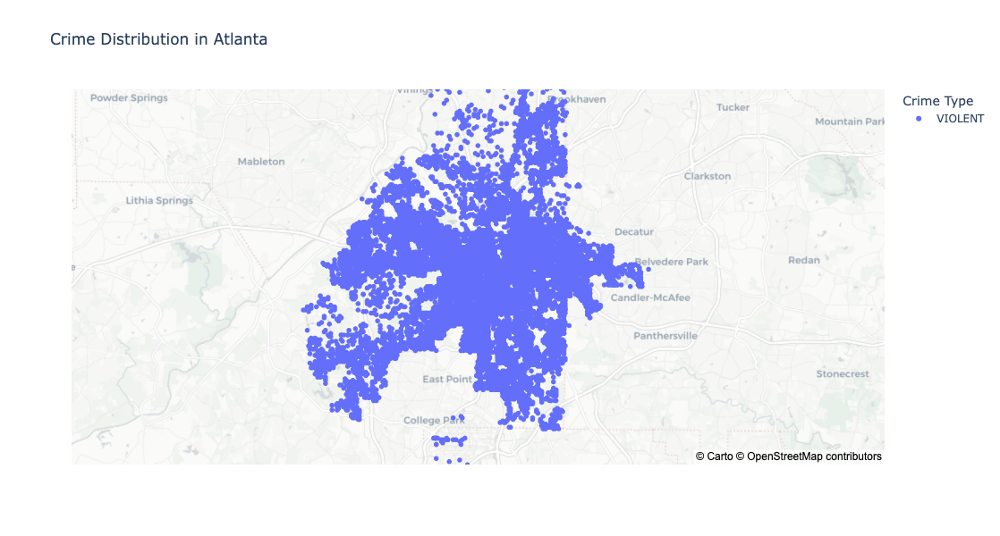

In [71]:
def visual2():

  import plotly.express as px
  import pandas as pd


  def year_format(x):
      try:
          l = x.split('/')
          if len(l[1]) == 1:
              l[1] = '0' + l[1]
          if len(l[0]) == 1:
              l[0] = '0' + l[0]

          o = [l[2], l[0], l[1]]
          return ('-'.join(o) )
      except:
          a = x
  def crime_type(x):
          if x in ['HOMICIDE', 'ROBBERY', 'AGG ASSAULT']:
              return 'VIOLENT'
          else:
              return 'NON-VIOLENT'

  dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
  dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)

  dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )
  dfCrime['Crime Type'] = pd.Series(dfCrime['Crime Type']).apply( lambda x : crime_type(x) )

  dfCrime['Latitude'] = dfCrime['Latitude'].round(3)
  dfCrime['Longitude'] = dfCrime['Longitude'].round(3)

  droplist = []
  for i in dfCrime.index:
      if dfCrime.loc[i,'Occur Date'] is None:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
          droplist.append(i)
      elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
          droplist.append(i)
      elif  dfCrime.loc[i,'Crime Type'] == 'NON-VIOLENT':
          droplist.append(i)

  dfCrime = dfCrime.drop(droplist, axis=0)
  
  fig = px.scatter_mapbox(
    dfCrime,
    lat="Latitude",
    lon="Longitude",
    color="Crime Type",
    hover_name="Neighborhood",
    hover_data={"Longitude": True, "Latitude": True, "Crime Type": True},
    title="Crime Distribution in Atlanta",
    mapbox_style="carto-positron",
    zoom=10,
    height=600,)
  fig.show()






############ Function Call ############
visual2()

### Visualization 2 Explanation

This chloropeth map proves that Atlanta's crime density is not randomly distributed, but rather clustered in places closer to central Atlanta. This follows our inital predictions regarding crime density within the city of Atlanta. Based on the graph the data is more clustered in central areas, indicating that the distribution of crime in Atlanta is significantly influenced by urban density.

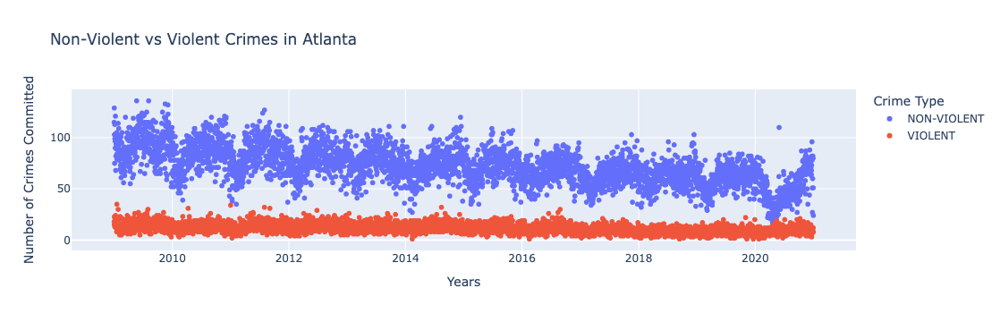

In [103]:
def visual3():
    import plotly.express as px
    import pandas as pd
    import numpy as np
    
    def year_format(x):
        try:
            l = x.split('/')
            if len(l[1]) == 1:
                l[1] = '0' + l[1]
            if len(l[0]) == 1:
                l[0] = '0' + l[0]
    
            o = [l[2], l[0], l[1]]
            return ('-'.join(o) )
        except:
            a = x
    def crime_type(x):
        if x in ['HOMICIDE', 'ROBBERY', 'AGG ASSAULT']:
            return 'VIOLENT'
        else:
            return 'NON-VIOLENT'
    
    dfCrime = pd.read_csv('phase2_data_cleaning/cleaned_atlantaCrime_csv_data.csv')
    dfCrime = dfCrime.drop(['Unnamed: 0'], axis=1)
    
    dfCrime['Occur Date'] = pd.Series(dfCrime['Occur Date']).apply( lambda x : year_format(x) )
    dfCrime['Crime Type'] = pd.Series(dfCrime['Crime Type']).apply( lambda x : crime_type(x) )
    
    
    droplist = []
    for i in dfCrime.index:
        if dfCrime.loc[i,'Occur Date'] is None:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) < 2009:
            droplist.append(i)
        elif int( dfCrime.loc[i,'Occur Date'].split('-')[0] ) > 2024:
            droplist.append(i)

    dfCrime = dfCrime.drop(droplist, axis=0)
    
    stats = dfCrime.groupby(["Occur Date", "Crime Type"])["Report Number"].count().reset_index()
    stats.columns = ["Occur Date", "Crime Type", "Number of Crimes Committed"]
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    
    stats['Occur Date'] = np.array(stats['Occur Date'], dtype='datetime64[D]')
    stats['Year'] = pd.Series(stats['Occur Date']).apply( lambda x : x.year )

    fig = px.scatter(stats, x="Occur Date", y="Number of Crimes Committed", color="Crime Type", title='Non-Violent vs Violent Crimes in Atlanta'
                     , labels={"Occur Date": "Years"})
    
    fig.show()


############ Function Call ############
visual3()

### Visualization 3 Explanation

This scatterplot reveals that the number of non-violent crimes in Atlanta are more suspectible to change than the number of violent crimes in Atlanta. We initally thought that violent crimes would fluctuate a lot more than is shown, and that the number of violent crimes would be much higher than is shown in the scatterplot. The red shows how the number of violent crimes stays moderately consistent, while non-violent crimes fluctuate based on various external factors. Nonviolent crimes are more responsive to situational and financial factors. Violent crimes continue to be stable over time, indicating issues that develop slowly.

# Cited Sources

If you used any additional sources to complete your Data Analysis section, list them here:


*   Example Module Documentation
*   Example Stack Overflow Assistance



# Graphical User Interface (GUI) Implementation
If you decide to create a GUI for Phase II, please create a separate Python file (.py) to build your GUI. You must submit both the completed PhaseII.ipynb and your Python GUI file.

# Submission

Prior to submitting your notebook to Gradescope, be sure to <b>run all functions within this file</b>. We will not run your functions ourselves, so we must see your outputs within this file in order to receive full credit.
